# Y = a0 + a1 * X1 + a2 * X2 + ... + ai * Xi

In [1]:
# Fuente: https://aegis4048.github.io/mutiple_linear_regression_and_visualization_in_python

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import linear_model
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline

In [2]:
######################################## Data preparation #########################################

file = 'https://aegis4048.github.io/downloads/notebooks/sample_data/unconv_MV_v5.csv'
df = pd.read_csv(file)
df

# 📌 ¿Qué contiene este dataset?

# 200 filas → cada fila corresponde a un pozo ("Well").

# 8 columnas:

# Columna	Significado (aprox.)
# Well	ID del pozo (1 a 200)
# Por	Porosidad (%)
# Perm	Permeabilidad (mD)
# AI	Acoustic Impedance (impedancia acústica)
# Brittle	Índice de fragilidad de la roca
# TOC	Total Organic Carbon (contenido orgánico total)
# VR	Vitrinite Reflectance (madurez térmica)
# Prod	Producción (target, salida a predecir)


,Well,Por,Perm,AI,Brittle,TOC,VR,Prod
0,1,12.08,2.92,2.80,81.40,1.16,2.31,4165.196191
1,2,12.38,3.53,3.22,46.17,0.89,1.88,3561.146205
2,3,14.02,2.59,4.01,72.80,0.89,2.72,4284.348574
3,4,17.67,6.75,2.63,39.81,1.08,1.88,5098.680869
4,5,17.52,4.57,3.18,10.94,1.51,1.90,3406.132832
...,...,...,...,...,...,...,...,...
195,196,11.95,3.13,2.97,67.18,0.80,2.06,3847.571003
196,197,17.99,9.87,3.38,44.32,0.98,2.08,5601.227131
197,198,12.12,2.27,3.52,57.07,-0.04,1.73,3409.575363
198,199,15.55,4.48,2.48,58.25,1.89,2.35,5087.592149


In [3]:
df.describe()

,Well,Por,Perm,AI,Brittle,TOC,VR,Prod
count,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000
mean,100.500000,14.991150,4.330750,2.968850,48.161950,0.990450,1.964300,4311.219852
std,57.879185,2.971176,1.731014,0.566885,14.129455,0.481588,0.300827,992.038414
min,1.000000,6.550000,1.130000,1.280000,10.940000,-0.190000,0.930000,2107.139414
25%,50.750000,12.912500,3.122500,2.547500,37.755000,0.617500,1.770000,3618.064513
50%,100.500000,15.070000,4.035000,2.955000,49.510000,1.030000,1.960000,4284.687348
75%,150.250000,17.402500,5.287500,3.345000,58.262500,1.350000,2.142500,5086.089761
max,200.000000,23.550000,9.870000,4.630000,84.330000,2.180000,2.870000,6662.622385


In [4]:
# 📌 1. Seleccionamos dos columnas como variables de entrada (features)
# En este caso: 'Por' (porosidad) y 'Brittle' (fragilidad)
# .values → devuelve un array de NumPy en lugar de un DataFrame
# reshape(-1,2) → asegura que tenga forma (n_muestras, 2), es decir, filas = muestras, columnas = features
X = df[['Por', 'Brittle']].values.reshape(-1, 2)
print("Forma de X:", X.shape)
print("Primeras 5 filas de X:\n", X[:5])

# 📌 2. Definimos la variable de salida (target) que queremos predecir
# En este caso: 'Prod' (producción de cada pozo)
Y = df['Prod']
print("\nForma de Y:", Y.shape)
print("Primeros 5 valores de Y:\n", Y[:5])

Forma de X: (200, 2)
Primeras 5 filas de X:
 [[12.08 81.4 ]
 [12.38 46.17]
 [14.02 72.8 ]
 [17.67 39.81]
 [17.52 10.94]]

Forma de Y: (200,)
Primeros 5 valores de Y:
 0    4165.196191
1    3561.146205
2    4284.348574
3    5098.680869
4    3406.132832
Name: Prod, dtype: float64


In [ ]:
######################## Prepare model data point for visualization ###############################
# 📌 El porqué de todo esto

# Vos querés visualizar un modelo en 3D:

# Eje X → Porosidad (Por)

# Eje Y → Fragilidad (Brittle)

# Eje Z → Producción (Prod)

# El problema es que tus datos reales (X, Y) son solo 200 puntos dispersos en ese espacio.
# 👉 Para dibujar la superficie del modelo (la predicción continua), necesitás un tablero con muchos puntos 
# (una malla regular) donde el modelo pueda predecir.


# 📌 1. → Extraés tus 200 puntos reales:
# X tiene dos columnas: [Por, Brittleness]
x = X[:, 0]   # primera columna = Por (porosidad)
y = X[:, 1]   # segunda columna = Brittleness (fragilidad)
z = Y         # target (producción)
print("Shapes -> x:", x.shape, "y:", y.shape, "z:", z.shape)

# 📌 2. Creamos rangos de valores para graficar
# Queremos explorar un espacio de posibles valores de Por y Brittleness
x_pred = np.linspace(6, 24, 30)    # Armás un rango de 30 valores entre 6 y 24 para Porosidad
y_pred = np.linspace(0, 100, 30)   # Armás un rango de 30 valores entre 0 y 100 para Fragilidad
print("x_pred shape:", x_pred.shape)
print("y_pred shape:", y_pred.shape)

# 📌 3. Creamos una grilla 2D con todas las combinaciones de x_pred e y_pred
# meshgrid genera dos matrices: xx_pred y yy_pred
# - xx_pred tiene todas las combinaciones de valores de x_pred repetidos por filas
# - yy_pred tiene todas las combinaciones de valores de y_pred repetidos por columnas
# 👉 Resultado: 900 puntos cubriendo todo el espacio.
xx_pred, yy_pred = np.meshgrid(x_pred, y_pred)

print("xx_pred shape:", xx_pred.shape)  # (30, 30)
print("yy_pred shape:", yy_pred.shape)  # (30, 30)

# 📌 4. Preparamos la matriz final de puntos para pasar a un modelo
# np.array([...]).T → transponemos para que cada fila sea [Por, Brittleness]
# .flatten() convierte la grilla (30x30) en un vector de 900 elementos
model_viz = np.array([xx_pred.flatten(), yy_pred.flatten()]).T

print("model_viz shape:", model_viz.shape)  # (900, 2)
print("Primeras 5 filas de model_viz:\n", model_viz[:5])


Shapes -> x: (200,) y: (200,) z: (200,)
x_pred shape: (30,)
y_pred shape: (30,)
xx_pred shape: (30, 30)
yy_pred shape: (30, 30)
model_viz shape: (900, 2)
Primeras 5 filas de model_viz:
 [[6.         0.        ]
 [6.62068966 0.        ]
 [7.24137931 0.        ]
 [7.86206897 0.        ]
 [8.48275862 0.        ]]


In [6]:
################################################ Train #############################################

ols = linear_model.LinearRegression()
model = ols.fit(X, Y)
predicted = model.predict(model_viz)

############################################## Evaluate ############################################

r2 = model.score(X, Y)


In [7]:
print(predicted.shape)
print(model_viz.shape)
predicted

(900,)
(900, 2)


array([ -80.65005842,  118.21518848,  317.08043537,  515.94568227,
        714.81092916,  913.67617606, 1112.54142295, 1311.40666985,
       1510.27191674, 1709.13716364, 1908.00241053, 2106.86765743,
       2305.73290432, 2504.59815122, 2703.46339811, 2902.32864501,
       3101.1938919 , 3300.0591388 , 3498.92438569, 3697.78963259,
       3896.65487948, 4095.52012638, 4294.38537327, 4493.25062017,
       4692.11586706, 4890.98111396, 5089.84636085, 5288.71160775,
       5487.57685464, 5686.44210154,   27.54519112,  226.41043801,
        425.27568491,  624.1409318 ,  823.0061787 , 1021.87142559,
       1220.73667249, 1419.60191938, 1618.46716628, 1817.33241317,
       2016.19766007, 2215.06290696, 2413.92815386, 2612.79340075,
       2811.65864765, 3010.52389454, 3209.38914144, 3408.25438833,
       3607.11963523, 3805.98488212, 4004.85012902, 4203.71537591,
       4402.58062281, 4601.4458697 , 4800.3111166 , 4999.17636349,
       5198.04161039, 5396.90685729, 5595.77210418, 5794.63735

In [8]:
############################################## Plot ################################################

plt.style.use('default')

fig = plt.figure(figsize=(12, 4))

ax1 = fig.add_subplot(131, projection='3d')
ax2 = fig.add_subplot(132, projection='3d')
ax3 = fig.add_subplot(133, projection='3d')

axes = [ax1, ax2, ax3]

for ax in axes:
    ax.plot(x, y, z, color='k', zorder=15, linestyle='none', marker='o', alpha=0.5)
    ax.scatter(xx_pred.flatten(), yy_pred.flatten(), predicted, facecolor=(0,0,0,0), s=20, edgecolor='#70b3f0')
    ax.set_xlabel('Porosity (%)', fontsize=12)
    ax.set_ylabel('Brittleness', fontsize=12)
    ax.set_zlabel('Gas Prod. (Mcf/day)', fontsize=12)
    ax.locator_params(nbins=4, axis='x')
    ax.locator_params(nbins=5, axis='x')

ax1.text2D(0.2, 0.32, 'aegis4048.github.io', fontsize=13, ha='center', va='center',
           transform=ax1.transAxes, color='grey', alpha=0.5)
ax2.text2D(0.3, 0.42, 'aegis4048.github.io', fontsize=13, ha='center', va='center',
           transform=ax2.transAxes, color='grey', alpha=0.5)
ax3.text2D(0.85, 0.85, 'aegis4048.github.io', fontsize=13, ha='center', va='center',
           transform=ax3.transAxes, color='grey', alpha=0.5)

ax1.view_init(elev=28, azim=120)
ax2.view_init(elev=4, azim=114)
ax3.view_init(elev=60, azim=165)

fig.suptitle('$R^2 = %.2f$' % r2, fontsize=20)

fig.tight_layout()

In [9]:
# hagamos una animación del gráfico, esto tarda
# FUENTE: http://jakevdp.github.com

from matplotlib import animation

def rotate(angle):
    ax1.view_init(elev=28, azim=angle)
    ax3.view_init(elev=60, azim=angle)
    ax2.view_init(elev=4, azim=angle)

rot_animation = animation.FuncAnimation(fig, rotate, frames=np.arange(0,362,2),interval=100)

rot_animation.save('rotation.gif', dpi=80, writer='Pillow')

MovieWriter Pillow unavailable; using Pillow instead.


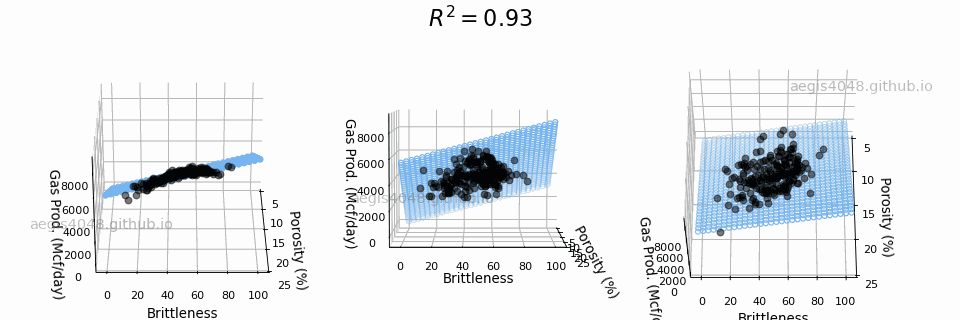

In [10]:
# https://gist.github.com/korakot/86f152571f15e921a16af6f916081f40
from IPython.display import Image

Image(open('rotation.gif','rb').read())